# Averaging to approximate inner maximization

In [6]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
import matplotlib.pyplot as plt
import numpy as np
import copy

# Juptyer magic: For export. Makes the plots size right for the screen 
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

%config InlineBackend.figure_formats = ['svg'] 


torch.backends.cudnn.deterministic = True
seed = np.random.randint(1,2000)
# seed = 4#62
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
print(seed)
g = torch.Generator()
g.manual_seed(seed)

114



# Data preparation

379


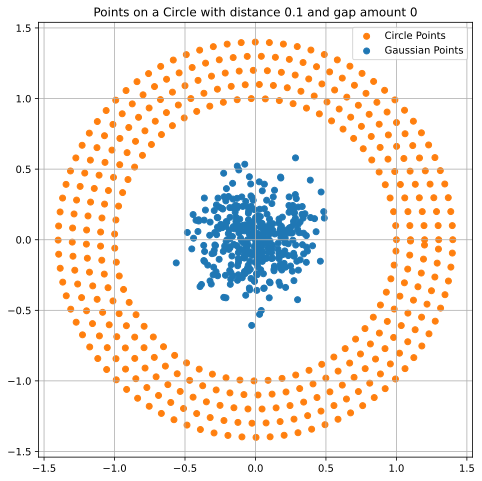

In [7]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader, TensorDataset

def generate_circle_points(radius, eps, gap_amount, dtype=torch.float32, label_type=torch.int64):
    """
    Generates points on a circle of given radius with a minimum distance between points.

    Args:
        radius (float): Radius of the circle.
        eps (float): Minimum Euclidean distance between points.
        dtype (torch.dtype): Data type for the points.
        label_type (torch.dtype): Data type for the labels.

    Returns:
        tuple: (points, labels) where points are of type dtype and labels are of type label_type.
    """
    points = []
    angle_step = 2 * np.arcsin(eps / (2 * radius))  # Approximation for minimum angle

    angle = 0.0
    while angle < 2 * np.pi - gap_amount*angle_step:
        x = radius * np.cos(angle)
        y = radius * np.sin(angle)
        points.append((x, y))
        angle += angle_step

    points = torch.tensor(points, dtype=dtype)
    labels = torch.ones(points.size(0), dtype=label_type)  # Assign label 1 to all points

    return points, labels

def generate_gaussian_points(count, mean, std_dev, dtype=torch.float32, label_type=torch.int64):
    """
    Generates Gaussian-distributed points around a given mean with standard deviation.

    Args:
        count (int): Number of points to generate.
        mean (float): Mean value for Gaussian distribution.
        std_dev (float): Standard deviation for Gaussian distribution.
        dtype (torch.dtype): Data type for the points.
        label_type (torch.dtype): Data type for the labels.

    Returns:
        tuple: (points, labels) where points are of type dtype and labels are of type label_type.
    """
    points = torch.normal(mean=mean, std=std_dev, size=(count, 2), dtype=dtype)
    labels = torch.zeros(count, dtype=label_type)  # Assign label 0 to all points

    return points, labels

# Parameters for the circle
radii = [1.,1.1,1.2,1.3,1.4]
epsilon = 0.1
gap_amount = 0

# Generate the dataset for the circle
circle_points_all = torch.zeros(0, dtype=torch.float32)
circle_labels_all = torch.ones(0, dtype=torch.int64)  # Assign label 1 to all points

for radius in radii:
    circle_points, circle_labels = generate_circle_points(radius, epsilon, gap_amount = gap_amount)
    circle_points_all = torch.cat((circle_points_all, circle_points), dim=0)
    circle_labels_all = torch.cat((circle_labels_all, circle_labels), dim=0)        
    

# Generate Gaussian-distributed points
num_gaussian_points = circle_points_all.size(0)
print(num_gaussian_points)
mean = 0.0
std_dev = 0.2
gaussian_points, gaussian_labels = generate_gaussian_points(num_gaussian_points, mean, std_dev)

# Combine datasets
all_points = torch.cat((circle_points_all, gaussian_points), dim=0)
all_labels = torch.cat((circle_labels_all, gaussian_labels), dim=0)



# Plot the points
plt.figure(figsize=(8, 8))
plt.scatter(circle_points_all[:, 0].numpy(), circle_points_all[:, 1].numpy(), color='C1', label='Circle Points')
plt.scatter(gaussian_points[:, 0].numpy(), gaussian_points[:, 1].numpy(), color='C0', label='Gaussian Points')
plt.title(f'Points on a Circle with distance {epsilon} and gap amount {gap_amount}')
plt.gca().set_aspect('equal', adjustable='box')
plt.legend()
plt.grid(True)
plt.show()


In [8]:

plotlim = [-2, 2]
subfolder = 'relu'
# data_size = 800
# aa_amount = 4
# adv_budget = 0.2
batch_size = 20

# Create a DataLoader
dataset = TensorDataset(all_points, all_labels)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)



# from models.training import create_dataloader
# dataloader, dataloader_viz = create_dataloader('circles_buffer', factor = factor, plotlim = plotlim, random_state = seed, data_size = data_size)


## Model dynamics

In [9]:
#Import of the model dynamics that describe the neural ODE
#The dynamics are based on the torchdiffeq package, that implements ODE solvers in the pytorch setting
from models.neural_odes import NeuralODEvar

#for neural ODE based networks the network width is constant. In this example the input is 2 dimensional
hidden_dim, data_dim = 2, 2 
augment_dim = 0

#T is the end time of the neural ODE evolution, num_steps are the amount of discretization steps for the ODE solver
T, time_steps = 5, 5
num_params = 5
bound = 0.
fp = False #this recent change made things not work anymore
cross_entropy = True
turnpike = False

non_linearity = 'relu' #'tanh'
architecture = 'outside' #inside


## Training and generating level sets

In [10]:
#was 200 for 500 points
num_epochs = 400 #00 #number of optimization runs in which the dataset is used for gradient decent

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
anode = NeuralODEvar(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=time_steps, num_params= num_params, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode = torch.optim.Adam(anode.parameters(), lr=1e-3)

anode_softplus10 = NeuralODEvar(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity='softplus10', 
                    architecture=architecture, T=T, time_steps=time_steps, num_params= num_params, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode_softplus10 = torch.optim.Adam(anode_softplus10.parameters(), lr=1e-3)

anode_softplus5 = NeuralODEvar(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity='softplus5', 
                    architecture=architecture, T=T, time_steps=time_steps, num_params= num_params, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode_softplus5 = torch.optim.Adam(anode_softplus5.parameters(), lr=1e-3)


In [11]:
anode.parameters

<bound method Module.parameters of NeuralODEvar(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): ReLU()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
      )
    )
  )
  (linear_layer): Linear(in_features=2, out_features=2, bias=True)
  (non_linearity): Tanh()
)>

In [12]:
from models.training import doublebackTrainer

trainer_anode = doublebackTrainer(anode, optimizer_anode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, eps = 0, verbose = True) 
trainer_anode.train(dataloader, num_epochs)

trainer_anode_softplus10 = doublebackTrainer(anode_softplus10, optimizer_anode_softplus10, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, eps = 0, verbose = True) 
trainer_anode_softplus10.train(dataloader, num_epochs)

trainer_anode_softplus5 = doublebackTrainer(anode_softplus5, optimizer_anode_softplus5, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, eps = 0, verbose = True) 
trainer_anode_softplus5.train(dataloader, num_epochs)


Iteration 0/38
Loss: 1.685
Robust Term Loss: 0.000
Accuracy: 0.350

Iteration 10/38
Loss: 1.142
Robust Term Loss: 0.000
Accuracy: 0.450

Iteration 20/38
Loss: 1.163
Robust Term Loss: 0.000
Accuracy: 0.500

Iteration 30/38
Loss: 1.375
Robust Term Loss: 0.000
Accuracy: 0.350
Epoch 1: 1.145

Iteration 0/38
Loss: 0.856
Robust Term Loss: 0.000
Accuracy: 0.650

Iteration 10/38
Loss: 0.970
Robust Term Loss: 0.000
Accuracy: 0.500

Iteration 20/38
Loss: 1.021
Robust Term Loss: 0.000
Accuracy: 0.550

Iteration 30/38
Loss: 1.088
Robust Term Loss: 0.000
Accuracy: 0.550
Epoch 2: 0.986

Iteration 0/38
Loss: 0.992
Robust Term Loss: 0.000
Accuracy: 0.450

Iteration 10/38
Loss: 0.639
Robust Term Loss: 0.000
Accuracy: 0.700

Iteration 20/38
Loss: 0.770
Robust Term Loss: 0.000
Accuracy: 0.700

Iteration 30/38
Loss: 0.740
Robust Term Loss: 0.000
Accuracy: 0.750
Epoch 3: 0.885

Iteration 0/38
Loss: 0.836
Robust Term Loss: 0.000
Accuracy: 0.700

Iteration 10/38
Loss: 0.678
Robust Term Loss: 0.000
Accuracy:

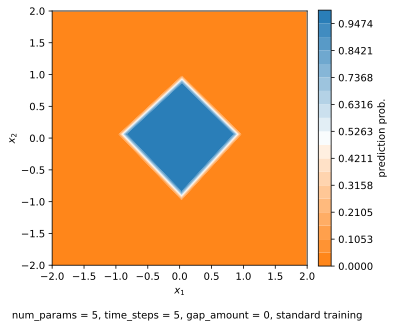

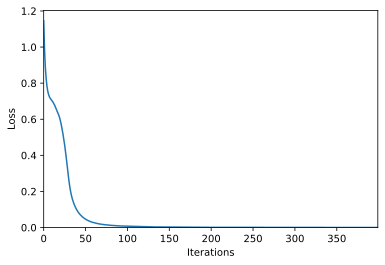

In [13]:
from plots.plots import classification_levelsets
import os
if not os.path.exists(subfolder):
    os.makedirs(subfolder)

amount_levels = 20
footnote = f'{num_params = }, {time_steps = }, {gap_amount = }, standard training'

fig_name_base = os.path.join(subfolder, 'levelsets')
_, ax = classification_levelsets(anode, plotlim = plotlim, amount_levels = 20,
                         footnote=footnote)



plt.savefig(fig_name_base + '.png', bbox_inches='tight',
            dpi=300, format='png', facecolor='white')


plt.show()

plt.plot(trainer_anode.histories['epoch_loss_history'])
plt.xlim(0, len(trainer_anode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

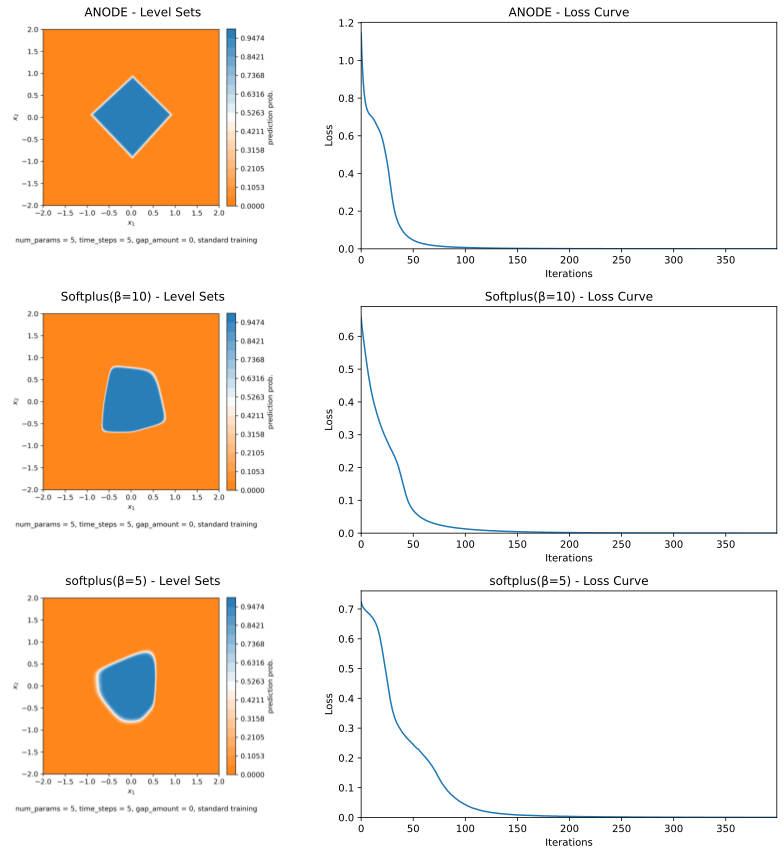

In [14]:
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg
from plots.plots import classification_levelsets

# Create folder if it does not exist
if not os.path.exists(subfolder):
    os.makedirs(subfolder)

# Set subplot layout (3 rows × 2 columns)
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))  

# List of models and trainers
models = [anode, anode_softplus10, anode_softplus5]
trainers = [trainer_anode, trainer_anode_softplus10, trainer_anode_softplus5]
titles = ['ANODE', 'Softplus(β=10)', 'softplus(β=5)']

# Generate and save classification level set plots
image_paths = []
for i, (model, title) in enumerate(zip(models, titles)):
    img_path = os.path.join(subfolder, f'levelset_{title}')
    image_paths.append(img_path + '.png')  # Store full path with .png for reading

    # Generate and save classification level set image
    classification_levelsets(model, fig_name=img_path, plotlim=plotlim, amount_levels=20, 
                             footnote=f'{num_params = }, {time_steps = }, {gap_amount = }, standard training')

# Load saved images into subplots
for i, (trainer, title, img_path) in enumerate(zip(trainers, titles, image_paths)):
    # First column: Load classification level set image
    img = mpimg.imread(img_path)
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"{title} - Level Sets")
    axes[i, 0].axis("off")  # Hide axes labels

    # Second column: Loss curve
    axes[i, 1].plot(trainer.histories['epoch_loss_history'])
    axes[i, 1].set_xlim(0, len(trainer.histories['epoch_loss_history']) - 1)
    axes[i, 1].set_ylim(0)
    axes[i, 1].set_xlabel('Iterations')
    axes[i, 1].set_ylabel('Loss')
    axes[i, 1].set_title(f"{title} - Loss Curve")

# Adjust layout and save the combined figure
plt.tight_layout()
fig.savefig(os.path.join(subfolder, 'levelsets_comparison.png'), bbox_inches='tight', dpi=300, format='png', facecolor='white')

# Show the figure
plt.show()


In [15]:
def psi_manual(x, model):
    """
    x: a tensor of shape (2,) representing a point in R^2.
    model: a function mapping R^2 to R^2.
    
    Returns:
      The smallest singular value of the Jacobian of model at x.
    """
    # Ensure x is a leaf variable with gradient tracking enabled.
    x = x.clone().detach().requires_grad_(True)
    
    # Define a lambda function to ensure accurate input-output mapping
    func = lambda inp: model(inp)[0]
    
    # Compute the Jacobian using torch.autograd.functional.jacobian (compatible with Python 3.8)
    jacobian = torch.autograd.functional.jacobian(func, x, create_graph=True)
    
    # Compute singular values using svdvals (available in PyTorch 1.8, compatible with Python 3.8)
    singular_values = torch.svd(jacobian, compute_uv=False)[1]
    
   
    return singular_values.detach().numpy()

# Define a grid over the input space.
grid_size = 100 # Adjust as needed.
x_range = np.linspace(-1, 1, grid_size)
y_range = np.linspace(-1, 1, grid_size)
psi_values = np.zeros((grid_size, grid_size, 2))

# Put the model in evaluation mode.
anode.eval()

# Evaluate psi(x) over the grid.
for i, xv in enumerate(x_range):
    for j, yv in enumerate(y_range):
        # Create a 2D point as a torch tensor.
        x_point = torch.tensor([xv, yv], dtype=torch.float32)
        psi_values[j, i,:] = psi_manual(x_point, anode)

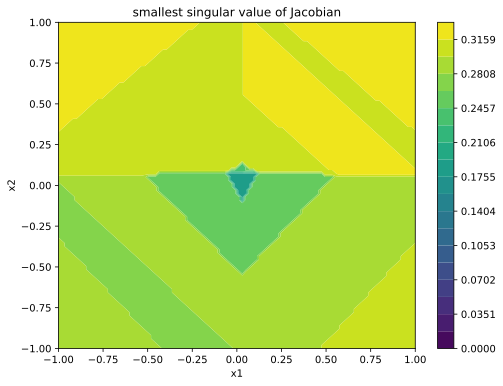

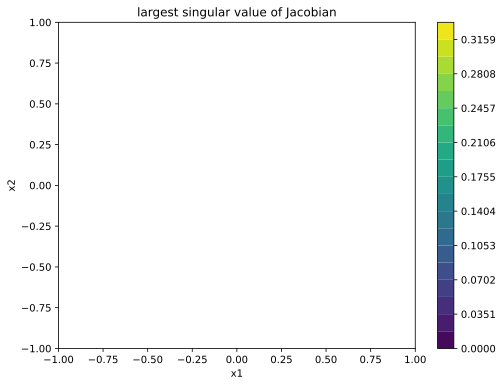

In [16]:

# Plot the contour corresponding to psi ~ 0.
plt.figure(figsize=(8, 6))
# Here we plot the contour at a small level, e.g., 0.01.
# CS = plt.contour(x_range, y_range, psi_values, levels=[0,0.05,0.1,0.2,0.3], colors='red')

# Define the number of levels for the contour plot
vmin, vmax = psi_values[:, :, 1].min(), psi_values[:, :, 1].max()
num_levels = 20
levels = np.linspace(0, vmax, num_levels)
# Create the contour plot using the 'binary' colormap
CS = plt.contourf(x_range, y_range, psi_values[:,:,1], levels=levels, cmap = 'viridis')
cbar = plt.colorbar(CS)
plt.title('smallest singular value of Jacobian')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

# Plot the contour corresponding to psi ~ 0.
plt.figure(figsize=(8, 6))
# Here we plot the contour at a small level, e.g., 0.01.
# CS = plt.contour(x_range, y_range, psi_values, levels=[0,0.05,0.1,0.2,0.3], colors='red')

# Define the number of levels for the contour plot


# Create the contour plot using the 'binary' colormap
CS = plt.contourf(x_range, y_range, psi_values[:,:,0], levels=levels, cmap = 'viridis')
cbar = plt.colorbar(CS)
plt.title('largest singular value of Jacobian')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()



In [17]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg
import matplotlib.colors as mcolors

# Ensure directory exists
if not os.path.exists(subfolder):
    os.makedirs(subfolder)


# Define grid over input space
grid_size = 200
interval_left, interval_right = -.5, 0.5
x_range = np.linspace(interval_left, interval_right, grid_size)
y_range = np.linspace(interval_left, interval_right, grid_size)
X, Y = np.meshgrid(x_range, y_range)  # Create 2D grid

# Models and Titles
models = [anode, anode_softplus10, anode_softplus5]
titles = ['ANODE', 'Softplus(β=10)', 'Softplus(β=5)']
image_paths = []  # Store file paths for the saved plots

psi_values = np.zeros((grid_size, grid_size, 2,3))

# Evaluate and save psi(x) for all 3 models
for i, (model, title) in enumerate(zip(models, titles)):
    model.eval()  # Set to evaluation mode

    # Vectorized Evaluation
    for ix in range(grid_size):
        for iy in range(grid_size):
            x_point = torch.tensor([X[iy, ix], Y[iy, ix]], dtype=torch.float32)
            psi_values[iy, ix, :, i] = psi_manual(x_point, model)



In [18]:
test = torch.rand((3,2,2))
print(test)
test[:,:,0].max()

tensor([[[0.7447, 0.2811],
         [0.6003, 0.4429]],

        [[0.4709, 0.2349],
         [0.1559, 0.6062]],

        [[0.0042, 0.5830],
         [0.0410, 0.2045]]])


tensor(0.7447)

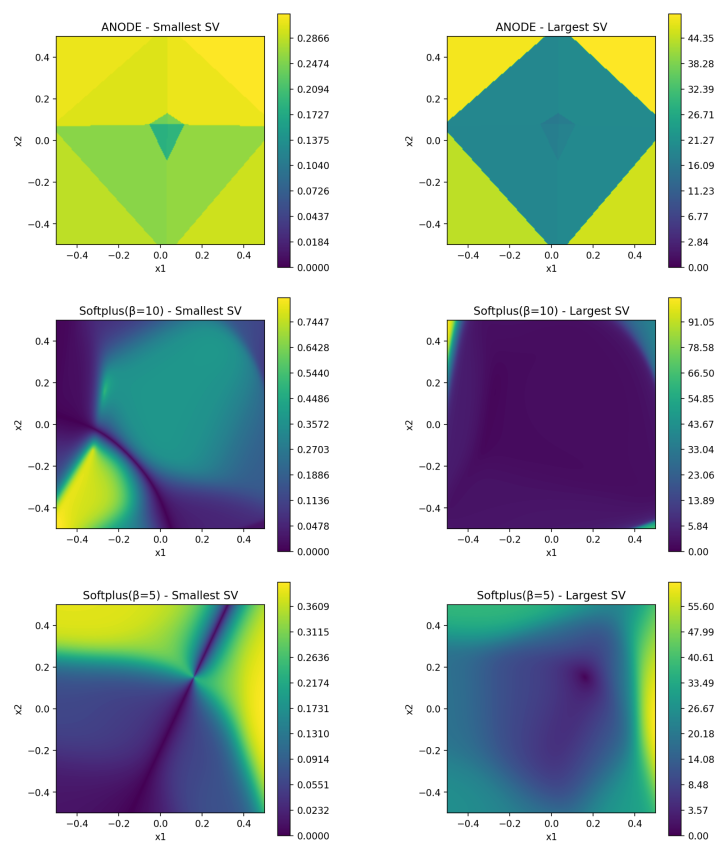

In [19]:
# Save the plots for each model
gamma = 0.8 # Power scale factor (gamma < 1 gives more resolution to small values)
num_levels = 200
for i, (model, title) in enumerate(zip(models, titles)):
    # Dynamic Levels for Contour Plot
    small_vmax = psi_values[:, :, 1, i].max()
    large_vmax = psi_values[:, :, 0,i].max()

    # File paths
    img_path_small = os.path.join(subfolder, f'psi_small_{title}')
    img_path_large = os.path.join(subfolder, f'psi_large_{title}')
    image_paths.append((img_path_small + '.png', img_path_large + '.png'))  

    # Plot for Smallest Singular Value
    plt.figure(figsize=(5, 5), dpi=200)
    norm = mcolors.PowerNorm(gamma=gamma, vmin=0, vmax=small_vmax)
    levels = np.linspace(0, 1, num_levels)
    levels = small_vmax * levels**(1/gamma)  # Transform to power scale
    CS = plt.contourf(X, Y, psi_values[:, :, 1,i], levels=levels, cmap='viridis', norm = norm)
    plt.colorbar(CS)
    plt.title(f'{title} - Smallest SV')
    plt.xlabel('x1')
    plt.ylabel('x2')
    # **Ensure Equal Axis Length**
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig(img_path_small + '.png', bbox_inches='tight', dpi=200, format='png', facecolor='white')
    plt.close()

    # Plot for Largest Singular Value
    plt.figure(figsize=(5, 5), dpi=200)
    norm = mcolors.PowerNorm(gamma=gamma, vmin=0, vmax=large_vmax)
    levels = np.linspace(0, 1, num_levels)
    levels = large_vmax * levels**(1/gamma)  # Transform to power scale
    CS = plt.contourf(X, Y, psi_values[:, :, 0,i], levels=levels, cmap='viridis', norm = norm)
    plt.colorbar(CS)
    plt.title(f'{title} - Largest SV')
    plt.xlabel('x1')
    plt.ylabel('x2')
    # **Ensure Equal Axis Length**
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig(img_path_large + '.png', bbox_inches='tight', dpi=200, format='png', facecolor='white')
    plt.close()


# Load and Arrange Plots in a Subplot Grid
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12), dpi=200)

for i, (title, (img_small_path, img_large_path)) in enumerate(zip(titles, image_paths)):
    # First column: Smallest singular value plot
    img_small = mpimg.imread(img_small_path)
    axes[i, 0].imshow(img_small)
    axes[i, 0].axis("off")  # Hide axes labels

    # Second column: Largest singular value plot
    img_large = mpimg.imread(img_large_path)
    axes[i, 1].imshow(img_large)
    axes[i, 1].axis("off")  # Hide axes labels

# Adjust layout and save final subplot figure
plt.tight_layout()
fig.savefig(os.path.join(subfolder, 'psi_comparison.png'), bbox_inches='tight', dpi=200, format='png', facecolor='white')

# Show the figure
plt.show()


0
tensor([0., 0.], grad_fn=<SelectBackward>)
1
tensor([0.0634, 0.0000], grad_fn=<SelectBackward>)
2
tensor([0.0000, 0.8624], grad_fn=<SelectBackward>)
3
tensor([0.1855, 0.7046], grad_fn=<SelectBackward>)
4
tensor([0.0000, 1.7997], grad_fn=<SelectBackward>)
5


IndexError: index 5 is out of range

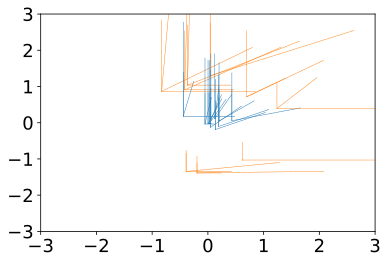

In [20]:
def plot_trajectory(model, inputs, targets, stepsize, time_interval = None, dpi=200, alpha=0.9,
                    alpha_line=0.9, x_lim = [-2,2], y_lim = [-2,2]):
    from matplotlib import rc
    rc("text", usetex=False)
    font = {'size': 18}
    rc('font', **font)

    # Define color based on targets

    color = ['C1' if targets[i] > 0.0 else 'C0' for i in range(len(targets))]
        
    
    
    if time_interval is None:
        time_interval = torch.tensor([0, model.T],dtype=torch.float32)
        
    start_time = time_interval[0].item()
    end_time = time_interval[1].item()
    num_steps_interval = int((end_time - start_time) / stepsize)
    # print('amount steps', num_steps_interval)
    integration_time = torch.arange(start_time, end_time + stepsize/100, stepsize) #using end_time + stepsize gave a weird inconsistency between including and excluding the step_size
    # print(integration_time)
    trajectories = model.flow(inputs, integration_time).detach() #output is of dimension [time_steps, number of inputs, dimension per input]

    
    for i in range(inputs.shape[0]):
        plt.plot(trajectories[:,i, 0], trajectories[:,i, 1], linestyle='-', marker='', color = color[i], alpha = alpha_line, linewidth = 0.5)
        
    
    x_min, x_max = x_lim[0], x_lim[1]
    y_min, y_max = y_lim[0], y_lim[1]
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    
    
    

    # plt.show()

# Example usage
# model, inputs, targets, timesteps should be defined before calling this function
step_size = T/time_steps 

X_viz, y_viz = next(iter(dataloader))

inputs = torch.tensor([0.,0.])

def Jacobian_subinterval(input, node, time_interval = torch.tensor([0, T], dtype=torch.float32)):
    input_to_output  = lambda input: node.flow(input, time_interval)[-1]
    print(input_to_output(input))
    J = torch.autograd.functional.jacobian(input_to_output, input)
    return J



for i in range(0,10):
    interval = torch.tensor([0,1], dtype=torch.float32) + i
    print(i)
    plot_trajectory(anode, X_viz[0:50], y_viz[0:50],stepsize = step_size, time_interval=interval, x_lim=[-3,3], y_lim = [-3,3])
    Jacobian_subinterval(inputs,anode, time_interval=interval)

In [ ]:
time_interval = torch.tensor([0,1], dtype=torch.float32)

def input_to_output(input, node, time_interval = torch.tensor([0, T], dtype=torch.float32)):
    return node.flow(input, time_interval)[-1]

def Jordan(input, node, time_interval = torch.tensor([0, T], dtype=torch.float32)):
    #fix the node so it is just a input to output of the other variable
    input_to_output_lambda = lambda input: input_to_output(input, node, time_interval)
    # Compute the Jacobian matrix
    return torch.autograd.functional.jacobian(input_to_output_lambda, input)
    
    
Jordan(inputs, anode, time_interval = time_interval)

tensor([[1., 0.],
        [0., 1.]])

In [ ]:
def psi_interval(x, model, time_interval = torch.tensor([0, T], dtype=torch.float32)):
    """
    x: a tensor of shape (2,) representing a point in R^2.
    model: a function mapping R^2 to R^2.
    
    Returns:
      singular values of the Jacobian of model at x.
    """
    # Ensure x is a leaf variable with gradient tracking enabled.
    x = x.clone().detach().requires_grad_(True)
    
    # Define a lambda function to ensure accurate input-output mapping
    
    # Compute the Jacobian using torch.autograd.functional.jacobian (compatible with Python 3.8)
    jacobian = Jordan(x,model, time_interval = time_interval)
    
    # Compute singular values using svdvals (available in PyTorch 1.8, compatible with Python 3.8)
    singular_values = torch.svd(jacobian, compute_uv=False)[1]
    
   
    return singular_values.detach().numpy()



In [ ]:
# Define a grid over the input space.
grid_size = 50 # Adjust as needed.
x_range = np.linspace(-1, 1, grid_size)
y_range = np.linspace(-1, 1, grid_size)
psi_values = np.zeros((grid_size, grid_size, num_params, 2))

num_levels = 100
levels = np.linspace(0, 3, num_levels)

for layer in range(num_params):
    time_interval = torch.tensor([0, 1], dtype=torch.float32) + layer
    
    # Evaluate psi(x) over the grid
    for i, xv in enumerate(x_range):
        for j, yv in enumerate(y_range):
            x_point = torch.tensor([xv, yv], dtype=torch.float32)
            psi_values[j, i, layer,:] = psi_interval(x_point, anode, time_interval=time_interval)

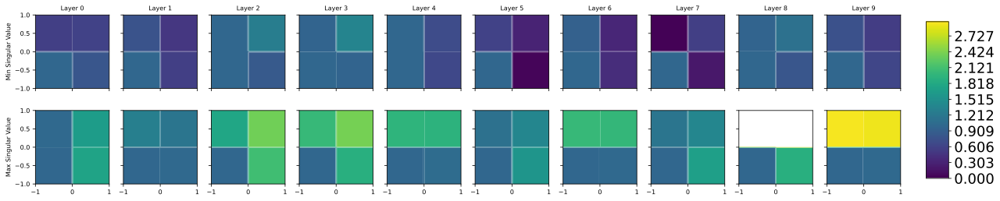

In [ ]:


fig, axes = plt.subplots(2, num_params, figsize=(2 * num_params, 4), sharex=True, sharey=True)

# Ensure each plot is square with equal aspect ratio
for ax in axes.flatten():
    ax.set_aspect('equal')
    ax.tick_params(axis='both', which='major', labelsize=8)  # Reduce tick label size

for layer in range(num_params):
    time_interval = torch.tensor([0, 1], dtype=torch.float32) + layer
    
    # Plot the smallest singular value in the first row
    CS_min = axes[0, layer].contourf(x_range, y_range, psi_values[:, :, layer, 1], levels=levels, cmap="viridis")  # Inverted colormap
    axes[0, layer].set_title(f'Layer {layer}', fontsize=8)  # Smaller title font
    if layer == 0:
        axes[0, layer].set_ylabel('Min Singular Value', fontsize=8)  # Reduce y-label size

    # Plot the largest singular value in the second row
    CS_max = axes[1, layer].contourf(x_range, y_range, psi_values[:, :, layer, 0], levels=levels, cmap="viridis")  # Inverted colormap
    if layer == 0:
        axes[1, layer].set_ylabel('Max Singular Value', fontsize=8)  # Reduce y-label size

# Adjust layout to ensure square plots
plt.subplots_adjust(wspace=0.1, hspace=0.3)  # Increase hspace slightly to reduce overlap

# Add a single colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position the colorbar outside
fig.colorbar(CS_min, cax=cbar_ax)

plt.show()

In [ ]:
# Define a grid over the input space.
grid_size = 50 # Adjust as needed.
x_range = np.linspace(-1, 1, grid_size)
y_range = np.linspace(-1, 1, grid_size)
psi_values = np.zeros((grid_size, grid_size, num_params, 2))

num_levels = 100
levels = np.linspace(0, 3, num_levels)

for layer in range(num_params):
    time_interval = torch.tensor([0, layer + 1], dtype=torch.float32)
    
    # Evaluate psi(x) over the grid
    for i, xv in enumerate(x_range):
        for j, yv in enumerate(y_range):
            x_point = torch.tensor([xv, yv], dtype=torch.float32)
            psi_values[j, i, layer,:] = psi_interval(x_point, anode, time_interval=time_interval)

In [ ]:


fig, axes = plt.subplots(2, num_params, figsize=(2 * num_params, 4), sharex=True, sharey=True)

# Ensure each plot is square with equal aspect ratio
for ax in axes.flatten():
    ax.set_aspect('equal')
    ax.tick_params(axis='both', which='major', labelsize=8)  # Reduce tick label size

for layer in range(num_params):
    time_interval = torch.tensor([0, 1], dtype=torch.float32) + layer
    
    # Plot the smallest singular value in the first row
    CS_min = axes[0, layer].contourf(x_range, y_range, psi_values[:, :, layer, 1], levels=levels, cmap="viridis")  # Inverted colormap
    axes[0, layer].set_title(f'[0, {layer + 1}]', fontsize=8)  # Smaller title font
    if layer == 0:
        axes[0, layer].set_ylabel('Min Singular Value', fontsize=8)  # Reduce y-label size

    # Plot the largest singular value in the second row
    CS_max = axes[1, layer].contourf(x_range, y_range, psi_values[:, :, layer, 0], levels=levels, cmap="viridis")  # Inverted colormap
    if layer == 0:
        axes[1, layer].set_ylabel('Max Singular Value', fontsize=8)  # Reduce y-label size

# Adjust layout to ensure square plots
plt.subplots_adjust(wspace=0.1, hspace=0.3)  # Increase hspace slightly to reduce overlap

# Add a single colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position the colorbar outside
fig.colorbar(CS_min, cax=cbar_ax)

plt.show()